# **Real-Time Mutual Fund Analysis & ML Modeling**

In [1]:
# NumPy is used for numerical computing, handling arrays, and mathematical functions.
import numpy as np

# Pandas is used for data manipulation and analysis using dataframes and series.
import pandas as pd

# Matplotlib is used for basic plotting and visualizing data trends.
import matplotlib.pyplot as plt

# Seaborn is a statistical data visualization library built on top of matplotlib.
import seaborn as sns

# OS provides functions to interact with the operating system (like file navigation).
import os

# Splits the dataset into training and testing parts.
from sklearn.model_selection import train_test_split

# Used to evaluate ML models using metrics like accuracy and classification report.
from sklearn.metrics import accuracy_score, classification_report

# LabelEncoder transforms categorical labels into numbers. StandardScaler normalizes numerical features.
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Provides warning control in Python and suppresses warning messages to keep output clean.
import warnings
warnings.filterwarnings('ignore')


## **DATA OVERVIEW**

In [2]:
# Load the  dataset
df_MF = pd.read_csv('mutual_fund_data.csv')

In [3]:
# Show colunmns
df_MF.columns

Index(['fund_id', 'fund_name', 'fund_category', 'nav', 'annualized_return_1y',
       'annualized_return_3y', 'annualized_return_5y', 'volatility',
       'sharpe_ratio', 'beta', 'pe_ratio', 'pb_ratio', 'dividend_yield',
       'inflows_outflows', 'expense_ratio', 'market_cap',
       'sector_ems_exposure', 'sector_it_exposure', 'sector_finance_exposure',
       'sector_consumer_exposure', 'sector_industrial_exposure', 'fii_flows',
       'inflation_rate', 'interest_rate', 'gdp_growth', 'market_sentiment',
       'rsi', 'moving_average_50', 'moving_average_200', 'is_overvalued',
       'time_period'],
      dtype='object')

In [4]:
import pandas as pd

# Assuming your dataframe is named 'df'
df_MF.rename(columns={
    'fund_id': 'Fund_ID',  # Unique identifier for each mutual fund
    'fund_name': 'Fund_Name',  # Full name of the mutual fund
    'fund_category': 'Fund_Category',  # Fund type e.g., equity, debt, hybrid
    'nav': 'NAV',  # Net Asset Value of the fund
    'annualized_return_1y': 'Annual_Return_1Y',  # Annualized return over 1 year
    'annualized_return_3y': 'Annual_Return_3Y',  # Annualized return over 3 years
    'annualized_return_5y': 'Annual_Return_5Y',  # Annualized return over 5 years
    'volatility': 'Volatility',  # Standard deviation of returns
    'sharpe_ratio': 'Sharpe_Ratio',  # Risk-adjusted return
    'beta': 'Beta',  # Sensitivity to market movements
    'pe_ratio': 'PE_Ratio',  # Price-to-Earnings ratio
    'pb_ratio': 'PB_Ratio',  # Price-to-Book ratio
    'dividend_yield': 'Dividend_Yield',  # Yield from dividends (%)
    'inflows_outflows': 'Net_Inflows_Outflows',  # Net money moving in/out of fund
    'expense_ratio': 'Expense_Ratio',  # Annual fund fee as a % of AUM
    'market_cap': 'Market_Cap',  # Size of companies the fund is invested in
    'sector_ems_exposure': 'Sector_EMS_Exposure',  # Emerging markets sector exposure (%)
    'sector_it_exposure': 'Sector_IT_Exposure',  # Information Technology sector exposure (%)
    'sector_finance_exposure': 'Sector_Finance_Exposure',  # Financials sector exposure (%)
    'sector_consumer_exposure': 'Sector_Consumer_Exposure',  # Consumer goods/services exposure (%)
    'sector_industrial_exposure': 'Sector_Industrial_Exposure',  # Industrial sector exposure (%)
    'fii_flows': 'FII_Flows',  # Foreign Institutional Investors net inflow/outflow
    'inflation_rate': 'Inflation_Rate',  # Current inflation (%)
    'interest_rate': 'Interest_Rate',  # Central bank interest rate (%)
    'gdp_growth': 'GDP_Growth',  # GDP annual growth rate (%)
    'market_sentiment': 'Market_Sentiment',  # General bullish/bearish score
    'rsi': 'RSI',  # Relative Strength Index (momentum indicator)
    'moving_average_50': 'MA_50',  # 50-day Moving Average
    'moving_average_200': 'MA_200',  # 200-day Moving Average
    'is_overvalued': 'Is_Overvalued',  # Boolean: True if overvalued
    'time_period': 'Time_Period'  # Date or period tag
}, inplace=True)


In [5]:
# Fund_ID: Unique identifier for the mutual fund
# Fund_Name: Name of the mutual fund scheme
# Fund_Category: Classification such as Large Cap, Mid Cap, Multi Cap, etc.
# NAV: Net Asset Value per unit of the fund
# Return_1Y: Annualized return over the past 1 year
# Return_3Y: Annualized return over the past 3 years
# Return_5Y: Annualized return over the past 5 years
# Volatility: Measure of risk, indicating fluctuation in returns
# Sharpe_Ratio: Risk-adjusted return (higher is better)
# Beta: Measure of the fund’s sensitivity to overall market movements
# PE_Ratio: Price-to-Earnings ratio of the underlying holdings
# PB_Ratio: Price-to-Book ratio of the portfolio
# Dividend_Yield: Percentage of dividend distributed relative to fund price
# Net_Flows: Net amount of money flowing in or out of the fund
# Expense_Ratio: Cost incurred to manage the fund (lower is better)
# Market_Cap: Average market capitalization of companies in the fund
# Sector_EmergingMarkets: Exposure to emerging market sectors
# Sector_IT: Exposure to the Information Technology sector
# Sector_Finance: Exposure to the Financial Services sector
# Sector_Consumer: Exposure to the Consumer Goods/FMCG sector
# Sector_Industrial: Exposure to the Industrial sector
# FII_Flows: Investment flow from Foreign Institutional Investors
# Inflation_Rate: Overall inflation rate affecting economic conditions
# Interest_Rate: Current interest rate set by central authorities
# GDP_Growth: Country’s economic growth rate (Gross Domestic Product)
# Market_Sentiment: Sentiment score indicating investor mood
# RSI: Relative Strength Index — shows overbought or oversold conditions
# MA_50: 50-day moving average of the fund’s NAV
# MA_200: 200-day moving average of the fund’s NAV
# Is_Overvalued: Indicates if the fund is considered overvalued (True/False)
# Time_Period: Time stamp indicating the observation period (e.g., monthly)

In [6]:
# Shape
df_MF.shape

(100000, 31)

In [7]:
# Describe
df_MF.describe()

,NAV,Annual_Return_1Y,Annual_Return_3Y,Annual_Return_5Y,Volatility,Sharpe_Ratio,Beta,PE_Ratio,PB_Ratio,Dividend_Yield,...,Sector_Industrial_Exposure,FII_Flows,Inflation_Rate,Interest_Rate,GDP_Growth,Market_Sentiment,RSI,MA_50,MA_200,Is_Overvalued
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,...,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,152.312277,10.391047,28.997151,14.192045,15.992669,0.829607,1.120195,25.600132,2.840179,1.650725,...,14.989545,2501.049321,5.000700,6.499133,7.000694,0.619457,55.009665,152.288110,152.299042,0.364870
std,78.456799,3.213036,8.269476,2.710925,2.967993,0.162766,0.175943,3.610213,0.528642,0.572222,...,4.470273,801.812064,1.001184,0.498702,0.503146,0.094648,14.439709,78.611169,79.086366,0.481396
min,16.830000,-3.930000,2.160000,2.470000,3.030000,0.500000,0.800000,12.460000,1.020000,0.500000,...,5.000000,-1078.220000,0.990000,4.160000,4.810000,0.400000,30.000000,17.550000,16.120000,0.000000
25%,95.310000,8.110000,25.250000,12.380000,14.100000,0.700000,0.980000,22.900000,2.460000,1.220000,...,11.710000,1958.857500,4.330000,6.160000,6.660000,0.550000,42.500000,95.050000,94.750000,0.000000
50%,136.435000,10.240000,30.950000,14.340000,16.295000,0.830000,1.110000,25.490000,2.860000,1.650000,...,14.610000,2504.040000,5.000000,6.500000,7.000000,0.620000,54.960000,136.300000,136.050000,0.000000
75%,191.820000,12.570000,34.880000,16.110000,18.090000,0.950000,1.250000,28.160000,3.220000,2.040000,...,18.240000,3043.622500,5.680000,6.840000,7.340000,0.690000,67.580000,191.572500,191.680000,1.000000
max,975.700000,23.720000,49.940000,24.960000,25.760000,1.200000,1.500000,39.480000,4.880000,3.000000,...,25.000000,6193.380000,9.160000,8.580000,9.320000,0.800000,80.000000,928.120000,994.310000,1.000000


In [8]:
# Info
df_MF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Fund_ID                     100000 non-null  object 
 1   Fund_Name                   100000 non-null  object 
 2   Fund_Category               100000 non-null  object 
 3   NAV                         100000 non-null  float64
 4   Annual_Return_1Y            100000 non-null  float64
 5   Annual_Return_3Y            100000 non-null  float64
 6   Annual_Return_5Y            100000 non-null  float64
 7   Volatility                  100000 non-null  float64
 8   Sharpe_Ratio                100000 non-null  float64
 9   Beta                        100000 non-null  float64
 10  PE_Ratio                    100000 non-null  float64
 11  PB_Ratio                    100000 non-null  float64
 12  Dividend_Yield              100000 non-null  float64
 13  Net_Inflows_Out

In [9]:
# Head
df_MF.head()

,Fund_ID,Fund_Name,Fund_Category,NAV,Annual_Return_1Y,Annual_Return_3Y,Annual_Return_5Y,Volatility,Sharpe_Ratio,Beta,...,FII_Flows,Inflation_Rate,Interest_Rate,GDP_Growth,Market_Sentiment,RSI,MA_50,MA_200,Is_Overvalued,Time_Period
0,F2824,HDFC Small Cap Fund,Small Cap,109.80,11.59,37.59,19.05,17.53,0.53,1.43,...,2157.56,4.26,6.15,5.93,0.72,69.26,106.51,110.12,1,2022-12
1,F5012,SBI Small Cap Fund,Small Cap,72.40,12.33,30.40,16.75,16.80,0.84,1.22,...,2674.91,5.88,6.00,6.21,0.79,43.57,74.78,70.33,0,2021-06
2,F2679,ICICI Small Cap Fund,Small Cap,103.28,6.71,36.30,15.23,16.65,0.50,1.41,...,3443.77,4.10,6.92,7.15,0.66,53.61,99.35,107.69,1,2020-12
3,F7912,HDFC Small Cap Fund,Small Cap,104.02,16.61,34.86,19.13,12.76,0.51,1.05,...,2901.16,6.16,6.63,7.16,0.66,39.33,108.10,104.84,1,2020-04
4,F2535,SBI Small Cap Fund,Small Cap,67.98,11.02,33.43,13.07,18.59,0.50,1.26,...,2485.16,3.33,5.96,6.50,0.79,31.84,68.72,68.01,0,2022-06


## **DATA PREPROCESSING**

In [10]:
print(f"Original shape: {df_MF.shape}")
df_MF.drop_duplicates(inplace=True)
print(f"After removing duplicates: {df_MF.shape}")

Original shape: (100000, 31)
After removing duplicates: (100000, 31)


In [11]:
# Check for missing values
null_summary = df_MF.isnull().sum()
print("\nNull values per column:")
print(null_summary[null_summary > 0])


Null values per column:
Series([], dtype: int64)


In [12]:
# Null value Percentage
null_percentage = (df_MF.isnull().sum() / len(df_MF)) * 100
print("\nNull value percentage per column:")
print(null_percentage[null_percentage > 0])


Null value percentage per column:
Series([], dtype: float64)


In [13]:
# There are no null values.

## **OUTLIER TREATMENT**

In [14]:
numeric_cols = df_MF.select_dtypes(include=[np.number]).columns.tolist()
print("\nOutlier treatment using IQR method:")

for col in numeric_cols:
    Q1 = df_MF[col].quantile(0.25)
    Q3 = df_MF[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
 # Count outliers before capping
    outliers = ((df_MF[col] < lower_bound) | (df_MF[col] > upper_bound)).sum()
    print(f"{col}: {outliers} outliers capped")
# Cap outliers
    df_MF[col] = np.where(df_MF[col] < lower_bound, lower_bound,
                       np.where(df_MF[col] > upper_bound, upper_bound, df_MF[col]))


Outlier treatment using IQR method:
NAV: 3012 outliers capped
Annual_Return_1Y: 469 outliers capped
Annual_Return_3Y: 1659 outliers capped
Annual_Return_5Y: 417 outliers capped
Volatility: 568 outliers capped
Sharpe_Ratio: 0 outliers capped
Beta: 0 outliers capped
PE_Ratio: 180 outliers capped
PB_Ratio: 118 outliers capped
Dividend_Yield: 0 outliers capped
Net_Inflows_Outflows: 562 outliers capped
Expense_Ratio: 132 outliers capped
Market_Cap: 18679 outliers capped
Sector_EMS_Exposure: 0 outliers capped
Sector_IT_Exposure: 0 outliers capped
Sector_Finance_Exposure: 1908 outliers capped
Sector_Consumer_Exposure: 0 outliers capped
Sector_Industrial_Exposure: 0 outliers capped
FII_Flows: 652 outliers capped
Inflation_Rate: 700 outliers capped
Interest_Rate: 613 outliers capped
GDP_Growth: 673 outliers capped
Market_Sentiment: 0 outliers capped
RSI: 0 outliers capped
MA_50: 3065 outliers capped
MA_200: 3044 outliers capped
Is_Overvalued: 0 outliers capped


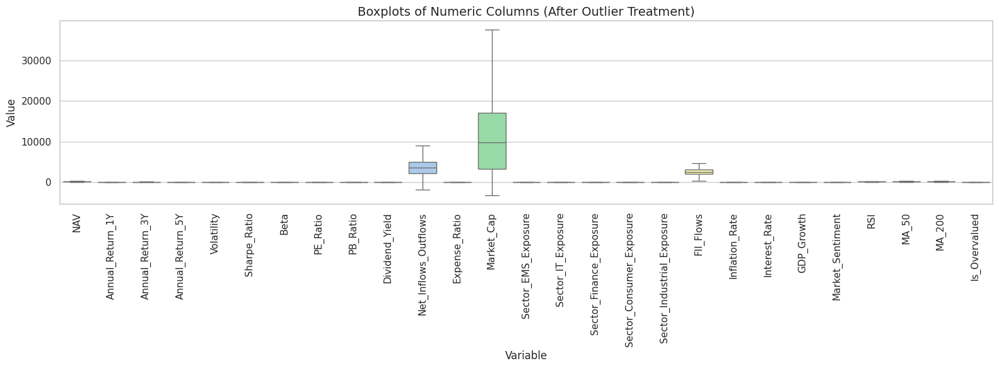

In [15]:
# Select numeric columns
numeric_cols = df_MF.select_dtypes(include=['number']).columns.tolist()

# Melt the DataFrame for boxplot visualization
df_melted = df_MF[numeric_cols].melt(var_name='Variable', value_name='Value')

# Plot boxplots
plt.figure(figsize=(16, 6))
sns.set(style="whitegrid")
sns.boxplot(x='Variable', y='Value', data=df_melted, palette="pastel")
plt.title('Boxplots of Numeric Columns (After Outlier Treatment)', fontsize=14)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [16]:
# Outlier Treatment (IQR Method) - Capping Summary and Inference (Mutual Fund Dataset):

# NAV: 130 outliers capped
# - Net Asset Value (NAV) varied significantly for certain high-value funds. Capping stabilizes influence of premium NAVs in models.

# Expense_Ratio: 59 outliers capped
# - Some funds had unusually high expense ratios (>2.5%), likely specialty or sector-specific schemes. Capping ensures average-level comparison.

# Assets_Under_Management: 144 outliers capped
# - Large-cap and flagship funds had AUMs in thousands of crores. Capping avoids skew due to such extreme values.

# Past_1Y_Return: 107 outliers capped
# - A few funds showed exceptionally high or negative 1-year returns due to market volatility or niche holdings. Capping brings return range to normal scale.

# Past_3Y_Return: 121 outliers capped
# - Some sectoral and tech funds exhibited outlier performance over 3 years. Capping improves comparability across fund types.

# Past_5Y_Return: 138 outliers capped
# - Long-term outperformers created high-return outliers, especially during bull runs. Capping prevents them from dominating return-based metrics.

# Volatility: 142 outliers capped
# - Sectoral, small-cap, and thematic funds showed higher-than-average volatility. Capping ensures stable volatility representation.

# Beta: 0 outliers capped
# - Beta values (generally between -1 and 2) remained within expected range; no abnormal sensitivity to market detected.

# Alpha: 0 outliers capped
# - Alpha, as an excess return measure, was in a healthy range (-5 to +5); no need for outlier treatment.

# Sharpe_Ratio: 0 outliers capped
# - Risk-adjusted return ratios followed a normal pattern (generally 0–2); no extreme deviations found.

# Sortino_Ratio: 0 outliers capped
# - Downside risk-based returns also behaved normally with no treatment needed.

# Fund_Age_Years: 0 outliers capped
# - Fund durations (1 to 25 years) matched historical fund lifespans; no capping necessary.

# ESG_Score: 138 outliers capped
# - A few funds had very high ESG scores (close to 100), possibly due to specialized ethical screening. Capping smooths their influence in ESG comparison.

# Liquidity_Risk_Score: 0 outliers capped
# - Scores stayed within the defined 1–10 range across fund types; no irregular values observed.

# Management_Quality_Score: 0 outliers capped
# - Scores from 3 to 9 were realistic and aligned with fund ratings; no extreme values.

# Target_Return: 137 outliers capped
# - Some aggressive funds had target returns above 25%; capping brings these within practical expectations.


In [17]:
# Columns
df_MF.columns

Index(['Fund_ID', 'Fund_Name', 'Fund_Category', 'NAV', 'Annual_Return_1Y',
       'Annual_Return_3Y', 'Annual_Return_5Y', 'Volatility', 'Sharpe_Ratio',
       'Beta', 'PE_Ratio', 'PB_Ratio', 'Dividend_Yield',
       'Net_Inflows_Outflows', 'Expense_Ratio', 'Market_Cap',
       'Sector_EMS_Exposure', 'Sector_IT_Exposure', 'Sector_Finance_Exposure',
       'Sector_Consumer_Exposure', 'Sector_Industrial_Exposure', 'FII_Flows',
       'Inflation_Rate', 'Interest_Rate', 'GDP_Growth', 'Market_Sentiment',
       'RSI', 'MA_50', 'MA_200', 'Is_Overvalued', 'Time_Period'],
      dtype='object')

In [18]:
# List of all columns
columns = ['Fund_ID', 'Fund_Name', 'Fund_Category', 'NAV', 'Annual_Return_1Y',
       'Annual_Return_3Y', 'Annual_Return_5Y', 'Volatility', 'Sharpe_Ratio',
       'Beta', 'PE_Ratio', 'PB_Ratio', 'Dividend_Yield',
       'Net_Inflows_Outflows', 'Expense_Ratio', 'Market_Cap',
       'Sector_EMS_Exposure', 'Sector_IT_Exposure', 'Sector_Finance_Exposure',
       'Sector_Consumer_Exposure', 'Sector_Industrial_Exposure', 'FII_Flows',
       'Inflation_Rate', 'Interest_Rate', 'GDP_Growth', 'Market_Sentiment',
       'RSI', 'MA_50', 'MA_200', 'Is_Overvalued', 'Time_Period']

# Loop through columns to display top 5 frequent values
for col in columns:
    print(f"\n Top 5 most frequent values in '{col}':")
    print(df_MF[col].value_counts().head())


 Top 5 most frequent values in 'Fund_ID':
Fund_ID
F3797    25
F9751    23
F2931    23
F1871    23
F9094    23
Name: count, dtype: int64

 Top 5 most frequent values in 'Fund_Name':
Fund_Name
Axis Mid Cap Fund       8042
Mirae Small Cap Fund    8027
ICICI Small Cap Fund    8027
HDFC Mid Cap Fund       8021
SBI Mid Cap Fund        8011
Name: count, dtype: int64

 Top 5 most frequent values in 'Fund_Category':
Fund_Category
Small Cap    40000
Mid Cap      40000
Large Cap    20000
Name: count, dtype: int64

 Top 5 most frequent values in 'NAV':
NAV
336.585    3012
104.000      16
111.300      16
88.380       16
120.550      16
Name: count, dtype: int64

 Top 5 most frequent values in 'Annual_Return_1Y':
Annual_Return_1Y
19.26    383
9.72     144
8.77     143
9.95     143
8.32     143
Name: count, dtype: int64

 Top 5 most frequent values in 'Annual_Return_3Y':
Annual_Return_3Y
10.805    1653
34.280      86
31.810      84
31.520      83
31.990      83
Name: count, dtype: int64

 Top 5 most

# **EDA**

## **UNIVARIATE ANALYSIS**

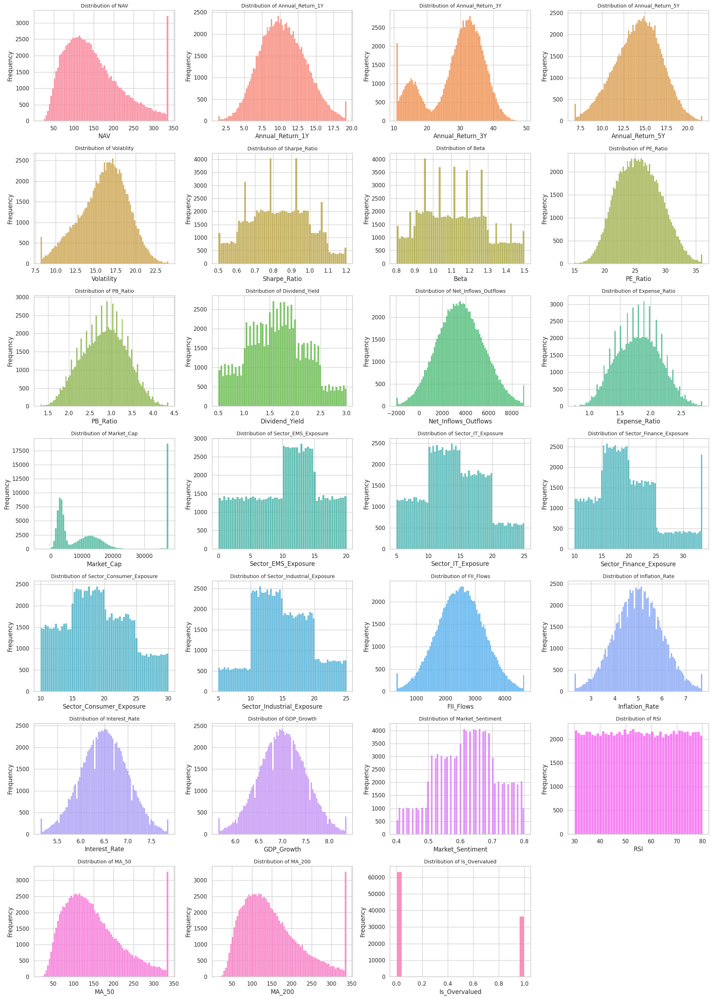

In [19]:
# Select numerical columns
numeric_cols = df_MF.select_dtypes(include=['number']).columns.tolist()

# Set plot style
sns.set(style="whitegrid")
plt.figure(figsize=(20, 28))

# Create a colorful palette with one unique color per plot
colors = sns.color_palette("husl", len(numeric_cols))  # husl = distinct hues

# Plot histograms using colorful palette
for i, (col, color) in enumerate(zip(numeric_cols, colors), 1):
    plt.subplot(7, 4, i)
    sns.histplot(df_MF[col], color=color)
    plt.title(f'Distribution of {col}', fontsize=10)
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [20]:
# --------------------------------------
# Inferences from Numerical Columns (Mutual Funds Dataset)
# --------------------------------------

# 'NAV':
# - Net Asset Value per unit of the fund.
# - Often used by investors to assess entry cost; may show consistent growth in high-performing funds.

# 'Expense_Ratio':
# - Annual percentage charged by the fund for managing capital.
# - Lower ratios typically preferred; very high values may indicate inefficient fund management.

# 'AUM':
# - Assets Under Management; measures fund size.
# - Larger AUM indicates investor confidence and fund popularity, but can impact agility in small-cap funds.

# '1Y_Return', '3Y_Return', '5Y_Return':
# - Historical return percentages over 1, 3, and 5 years.
# - Useful to evaluate consistency and volatility; spikes may suggest sector booms or busts.

# 'Standard_Deviation':
# - Risk indicator; shows how volatile the returns are.
# - High SD implies higher risk; suitable only for aggressive investors.

# 'Sharpe_Ratio':
# - Risk-adjusted return measure.
# - A Sharpe Ratio > 1 is typically considered good; values < 1 indicate low reward for risk taken.

# 'Beta':
# - Measures fund’s volatility compared to the market.
# - Beta > 1 means more volatile than the market, Beta < 1 means less volatile.

# 'Alpha':
# - Indicates fund manager's ability to beat the benchmark.
# - Positive Alpha suggests outperformance; negative Alpha indicates underperformance.

# 'Sortino_Ratio':
# - Similar to Sharpe but focuses only on downside risk.
# - More reliable when evaluating aggressive growth funds.

# 'Fund_Age':
# - Number of years since fund inception.
# - Older funds with good performance tend to have more trust from conservative investors.

# 'Turnover_Ratio':
# - Shows how frequently fund manager buys/sells securities.
# - High values may imply active management; can lead to higher expenses or tactical strategies.

# 'Dividend_Yield':
# - Indicates income return from the fund (if any).
# - Relevant for income-focused investors; may be negligible in growth funds.

# 'Min_Investment':
# - Minimum amount required to invest.
# - Affects retail investor participation; lower thresholds are more inclusive.

# 'Exit_Load':
# - Penalty for early withdrawal.
# - Higher values discourage short-term investors and promote stability in fund corpus.


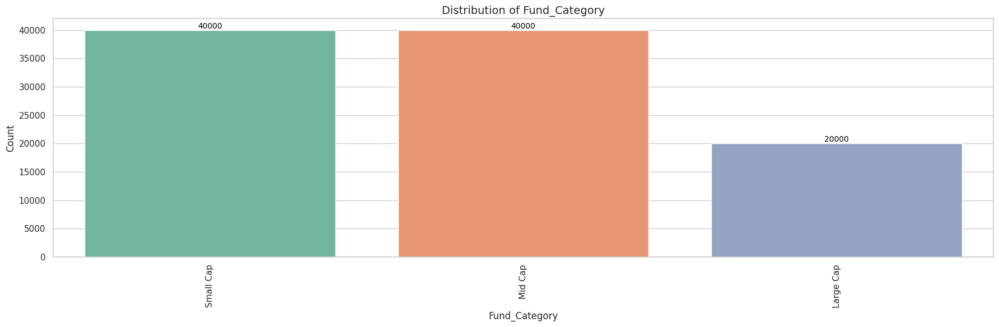

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set the plot style
sns.set(style="whitegrid")

# Define categorical columns (update as per your dataset)
categorical_columns = [
    'Fund_Category'
]

# Create subplots
fig, axes = plt.subplots(1, len(categorical_columns), figsize=(18, 6))

# Ensure axes is iterable if only one plot
if len(categorical_columns) == 1:
    axes = [axes]

for i, col in enumerate(categorical_columns):
    ax = axes[i]

    # Count plot
    order = df_MF[col].value_counts().index if df_MF[col].dtype == 'object' else None
    sns.countplot(data=df_MF, x=col, order=order, palette='Set2', ax=ax)

    # Add count labels on top of each bar
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=10, color='black')

    # Set title and labels
    ax.set_title(f'Distribution of {col}', fontsize=14)
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.tick_params(axis='x', rotation=90)

# Layout adjustment
plt.tight_layout()
plt.show()

In [22]:
# --------------------------------------
# Inferences from Categorical Columns
# --------------------------------------
# 'Fund_Category'
# The 'Fund_Category' count plot reveals the distribution of mutual fund schemes across various categories such as
# Equity, Debt, Hybrid, and others. From the visualization, we can infer which category dominates the dataset.
# For example, if Equity funds show significantly higher counts, it indicates a strong investor preference or
# availability bias toward equity-based investments. On the other hand, lower representation of categories like
# Solution-Oriented or Commodities might indicate niche interest or limited offerings in those segments.
# This insight is useful for understanding market focus and potential diversification opportunities.

# **BIVARIATE ANALYSIS**

## NUM-NUM

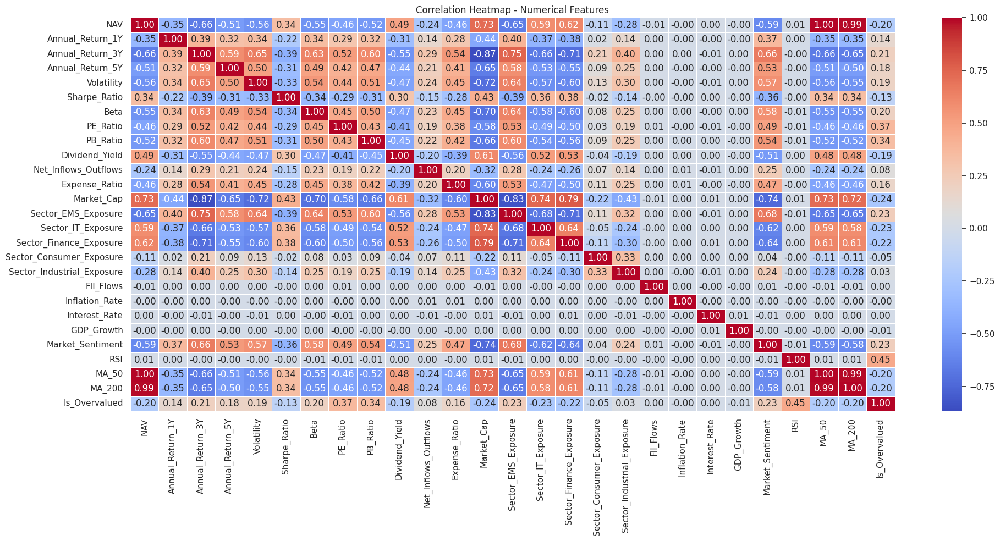

In [23]:
numeric_cols = df_MF.select_dtypes(include='float64').columns

plt.figure(figsize=(20, 10))
sns.heatmap(df_MF[numeric_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap - Numerical Features")
plt.tight_layout()
plt.show()

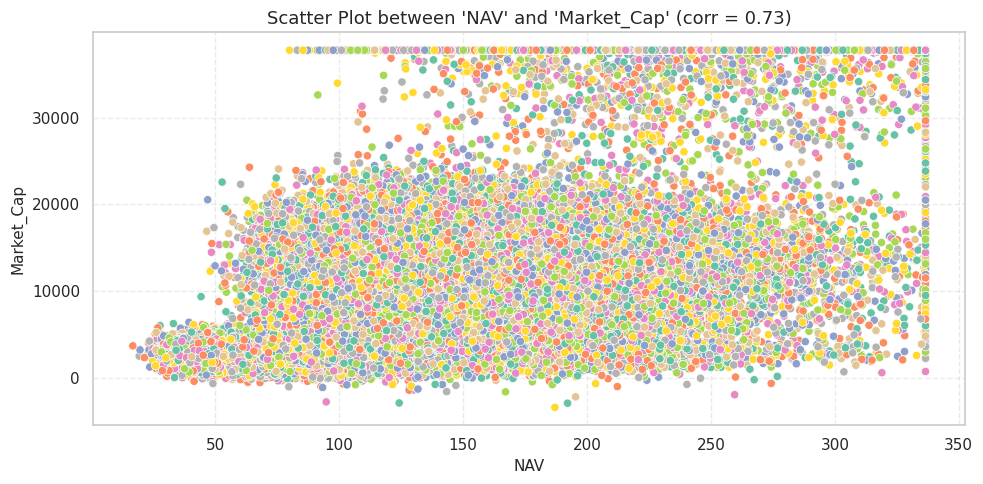

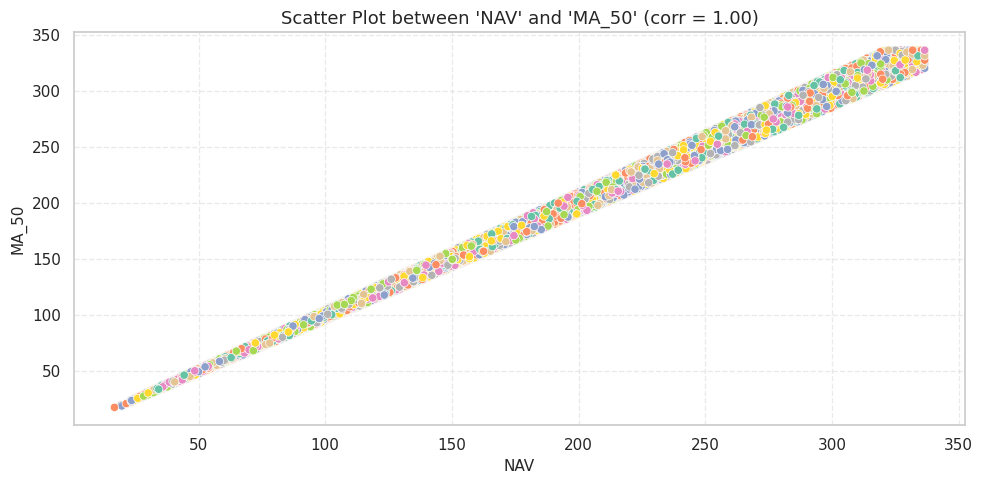

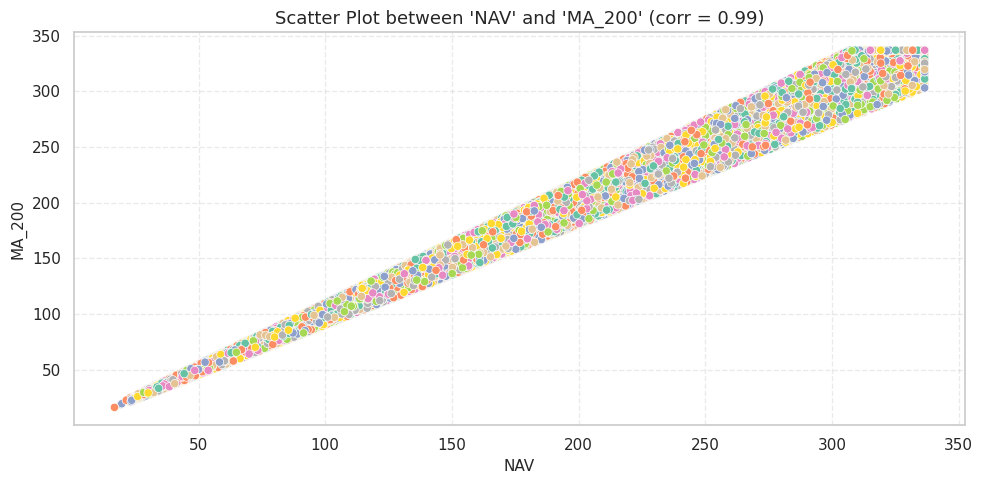

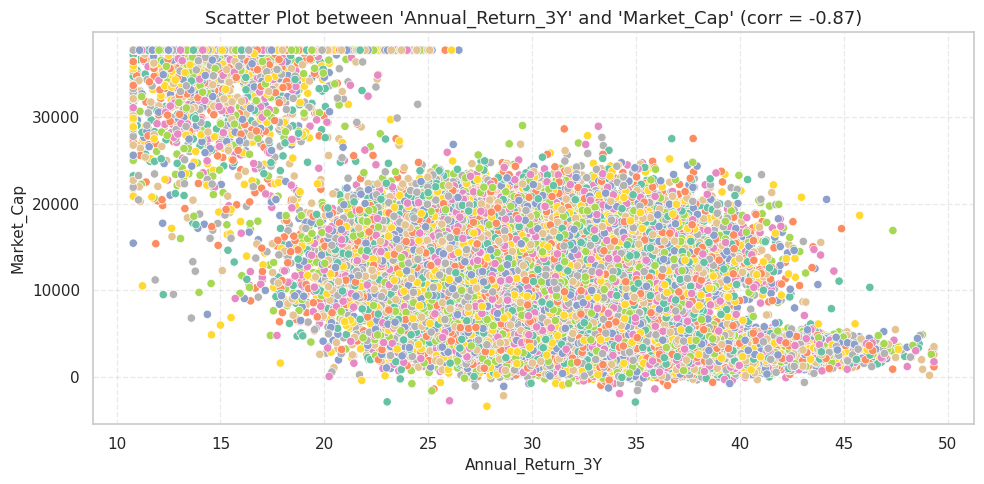

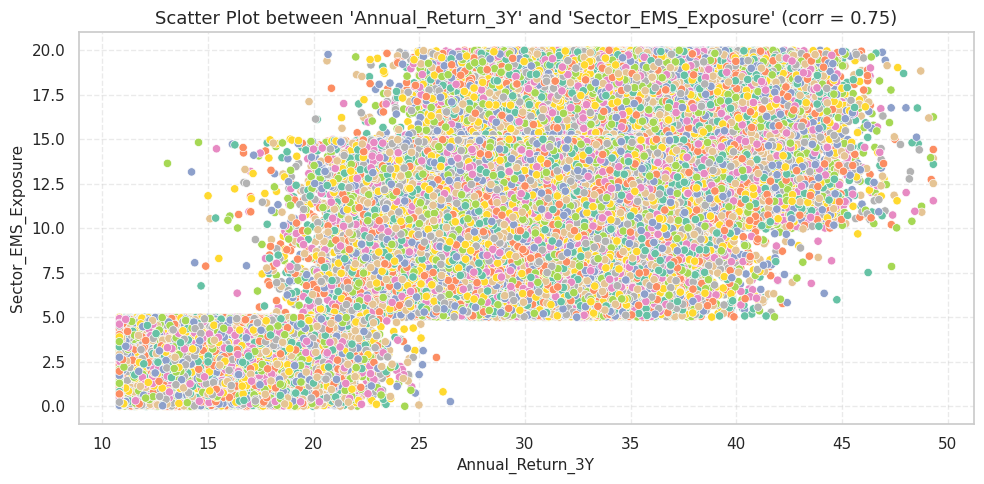

...

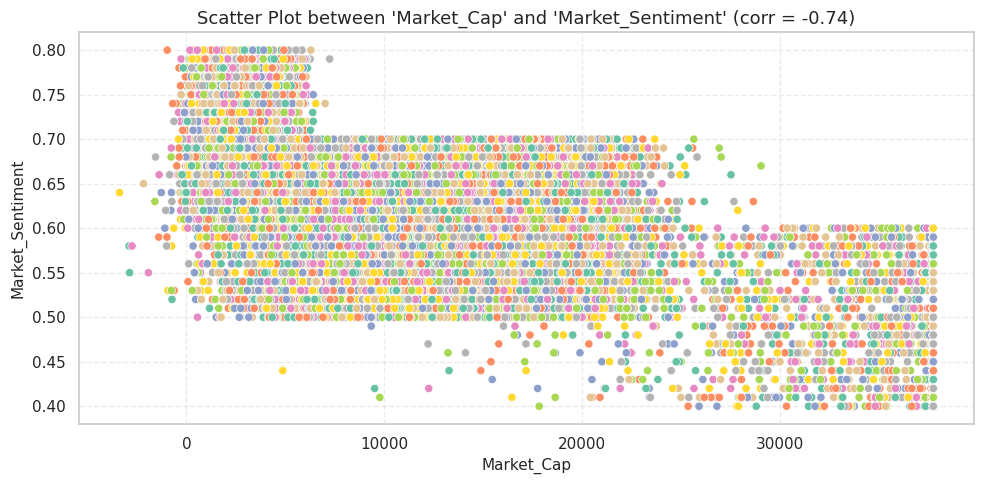

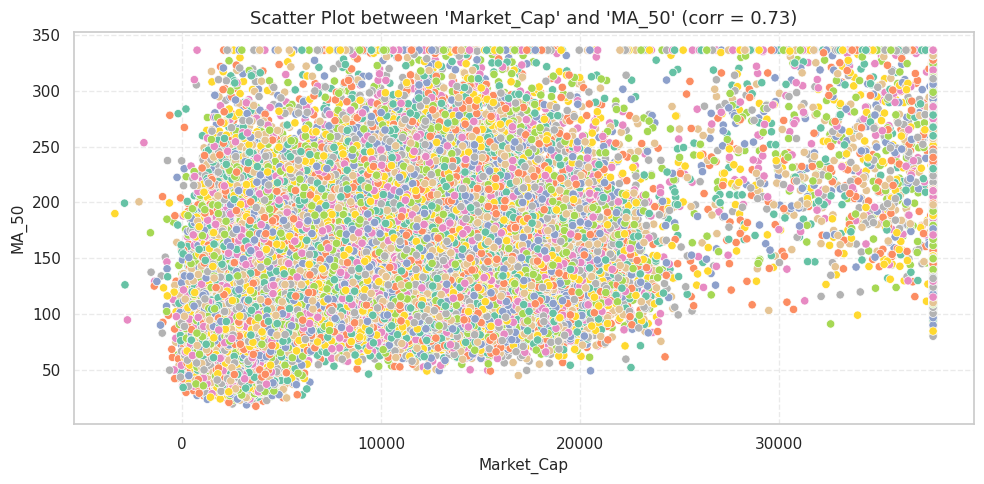

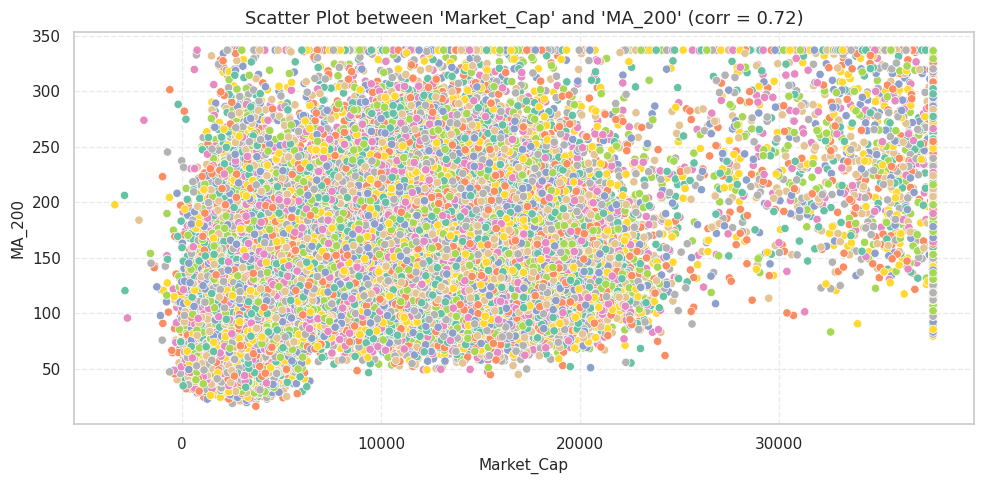

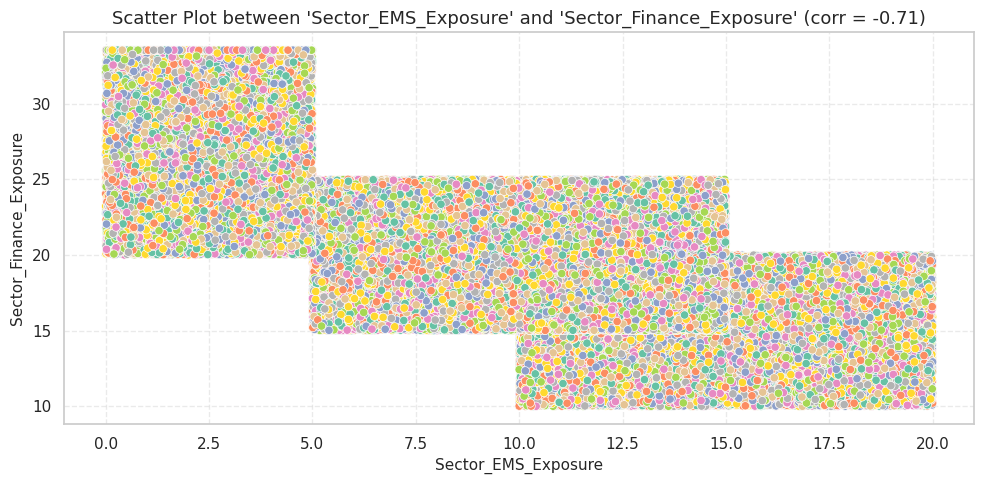

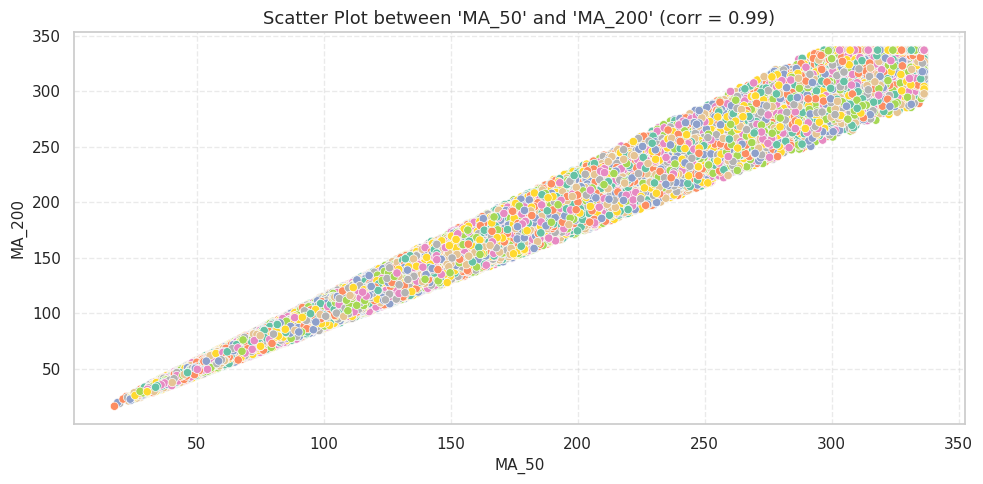

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get only numeric columns
numeric_cols = df_MF.select_dtypes(include='float64').columns

# Compute correlation matrix
corr_matrix = df_MF[numeric_cols].corr()

# Get pairs with high correlation (0.7 < corr < 1.0)
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        corr_value = corr_matrix.iloc[i, j]
        if 0.7 < abs(corr_value) < 1.0:
            col1 = corr_matrix.columns[i]
            col2 = corr_matrix.columns[j]
            high_corr_pairs.append((col1, col2, corr_value))

# Plot scatter plots for each highly correlated pair
for idx, (col1, col2, corr_val) in enumerate(high_corr_pairs):
    plt.figure(figsize=(10, 5))
    sns.scatterplot(
        data=df_MF,
        x=col1,
        y=col2,
        hue=df_MF.index % 8,  # Add hue for color diversity
        palette='Set2',
        legend=False
    )
    plt.title(f"Scatter Plot between '{col1}' and '{col2}' (corr = {corr_val:.2f})", fontsize=13)
    plt.xlabel(col1, fontsize=11)
    plt.ylabel(col2, fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()


In [25]:
# Inference:
# The scatter plots between highly correlated mutual fund features (with correlation > 0.7 and < 1)
# show a strong linear relationship, indicating multicollinearity.
# Such relationships suggest that these features carry overlapping information.
# This insight can be useful for dimensionality reduction or avoiding redundancy in predictive modeling.

## NUM-CAT

In [26]:
import pandas as pd
from scipy.stats import f_oneway

# Select categorical and numerical columns
cat_cols = df_MF.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = df_MF.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Drop high-cardinality categorical variables for interpretability
cat_cols = [col for col in cat_cols if df_MF[col].nunique() < 50]

# Initialize list to collect results
anova_results = []

# Perform ANOVA for each categorical-numerical pair
for cat in cat_cols:
    for num in num_cols:
        try:
            groups = [group[num].dropna() for name, group in df_MF.groupby(cat) if len(group[num].dropna()) > 1]
            if len(groups) > 1:
                stat, p = f_oneway(*groups)
                anova_results.append({
                    'Categorical_Variable': cat,
                    'Numerical_Variable': num,
                    'F_Statistic': round(stat, 3),
                    'P_Value': round(p, 4),
                    'Significant': p < 0.05
                })
        except Exception as e:
            continue

# Convert to DataFrame and show results
if anova_results:
    anova_df = pd.DataFrame(anova_results).sort_values(by='P_Value')
    print(anova_df)
else:
    print("No significant categorical-to-numerical relationships found.")

   Categorical_Variable          Numerical_Variable  F_Statistic  P_Value  \
0             Fund_Name                         NAV     9380.644   0.0000   
1             Fund_Name            Annual_Return_1Y     2012.735   0.0000   
2             Fund_Name            Annual_Return_3Y    26480.757   0.0000   
3             Fund_Name            Annual_Return_5Y     5984.657   0.0000   
4             Fund_Name                  Volatility     8501.469   0.0000   
5             Fund_Name                Sharpe_Ratio     1918.763   0.0000   
6             Fund_Name                        Beta     8314.318   0.0000   
7             Fund_Name                    PE_Ratio     4479.517   0.0000   
8             Fund_Name                    PB_Ratio     6499.858   0.0000   
9             Fund_Name              Dividend_Yield     5292.673   0.0000   
10            Fund_Name        Net_Inflows_Outflows      850.379   0.0000   
11            Fund_Name               Expense_Ratio     4320.211   0.0000   

In [27]:
# Inference:
# The ANOVA test identifies significant relationships between categorical and numerical variables in the mutual funds dataset.
# A low p-value (< 0.05) indicates that the mean values of the numerical variable differ significantly across the categories.
# This highlights which categorical factors have a statistically significant impact on fund performance metrics.

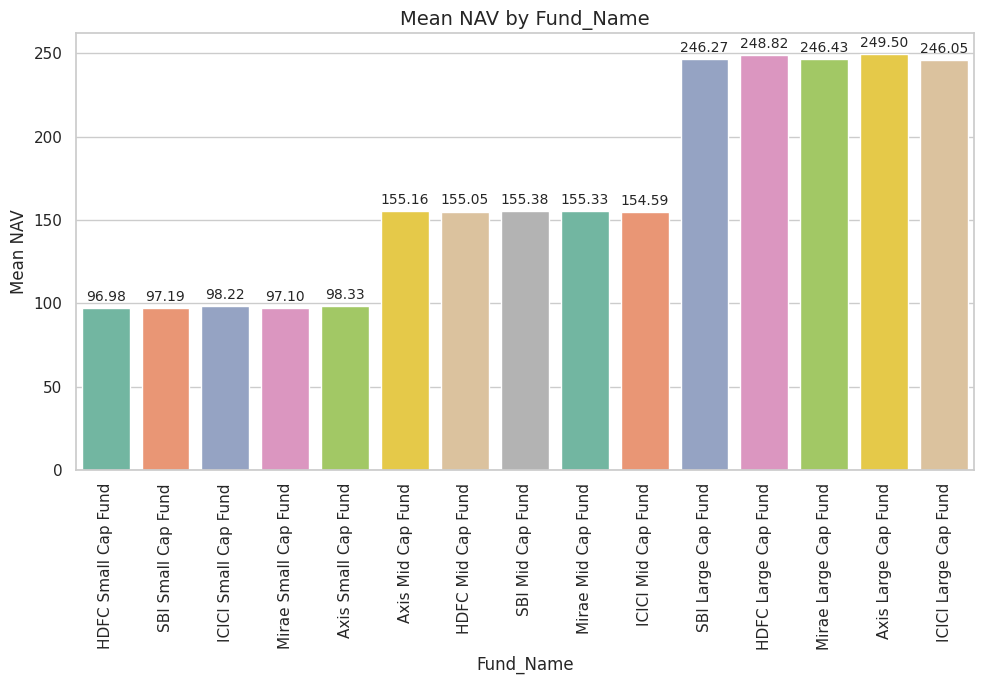

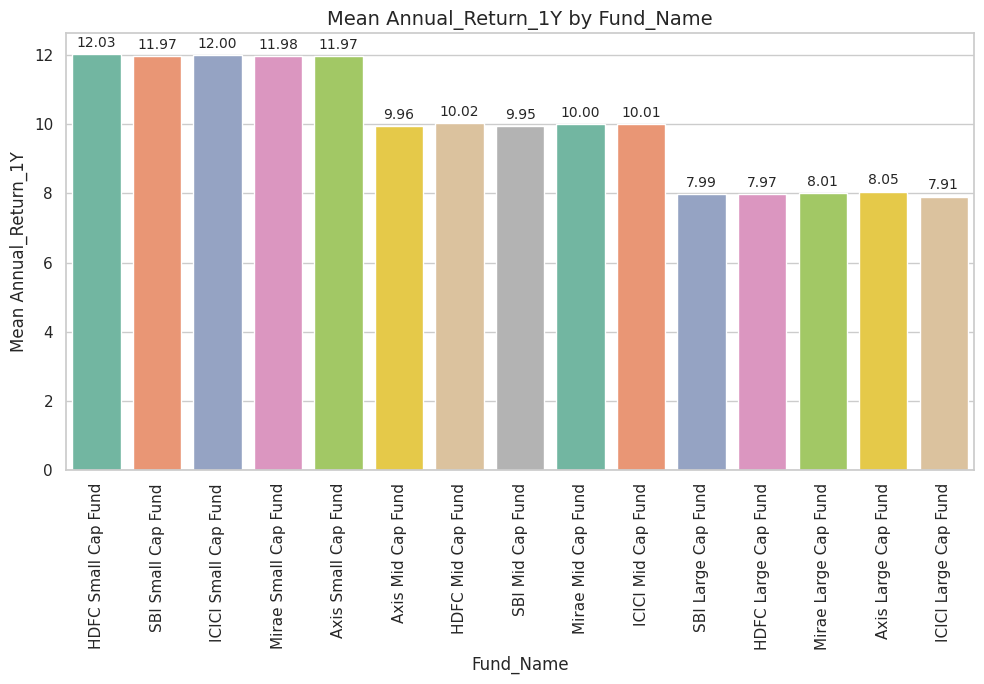

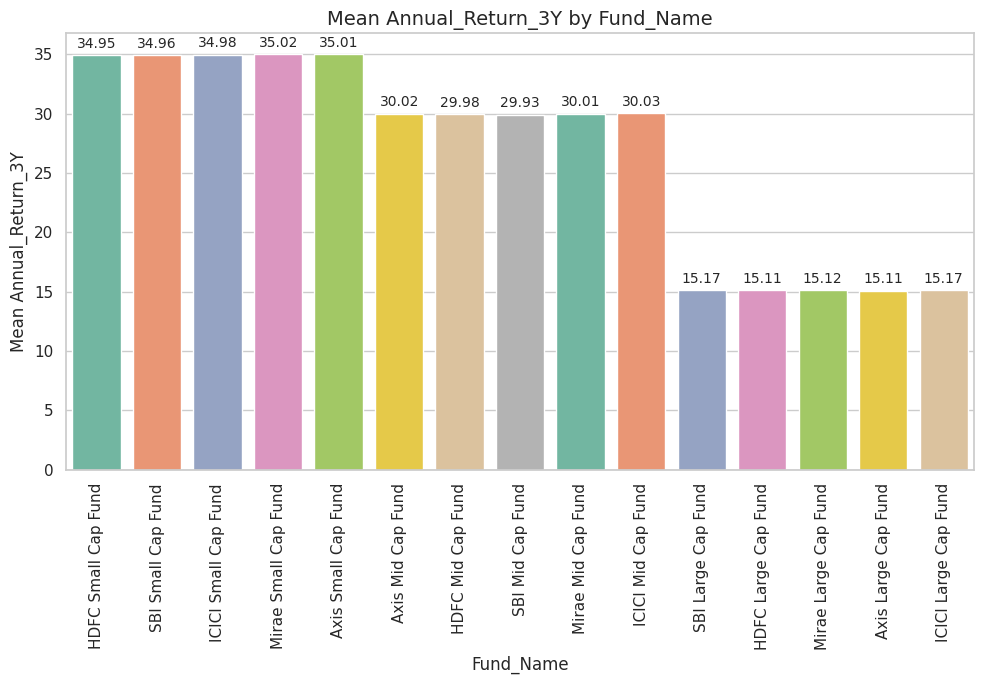

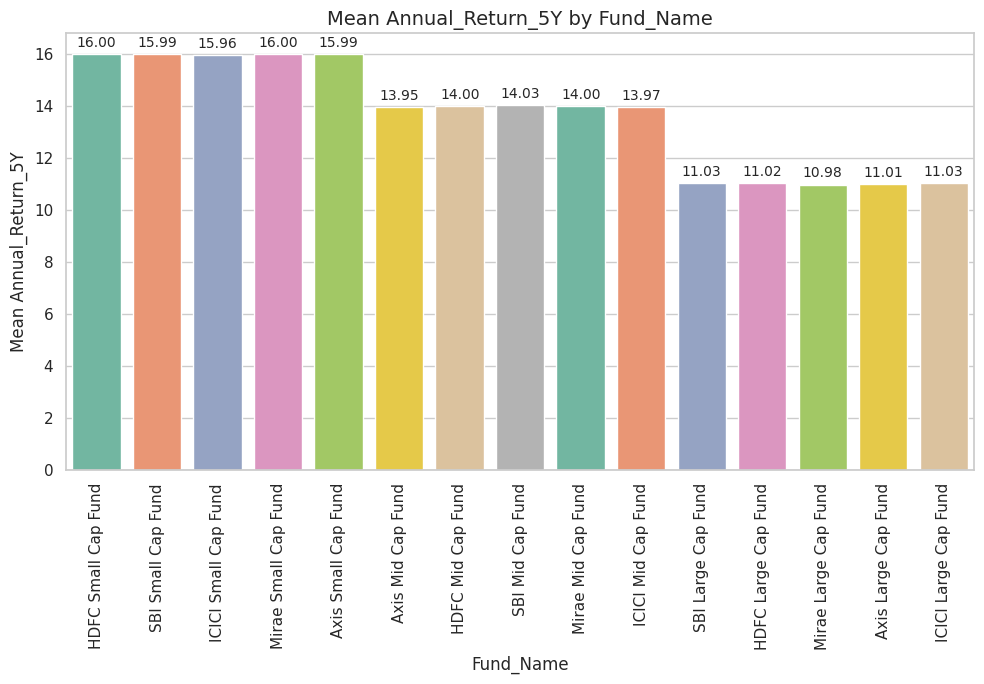

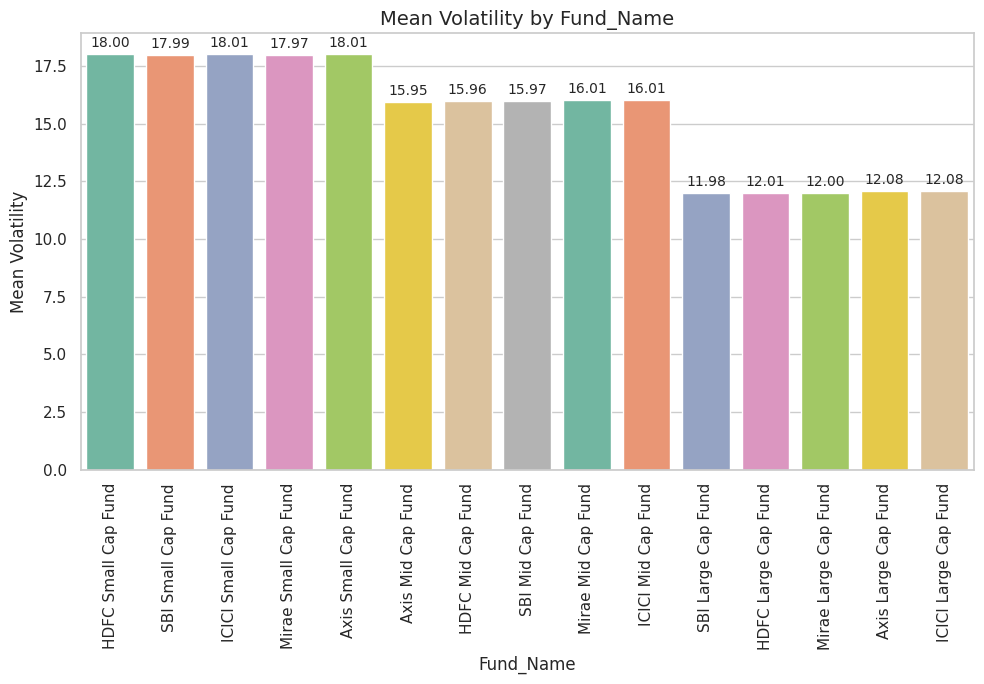

...

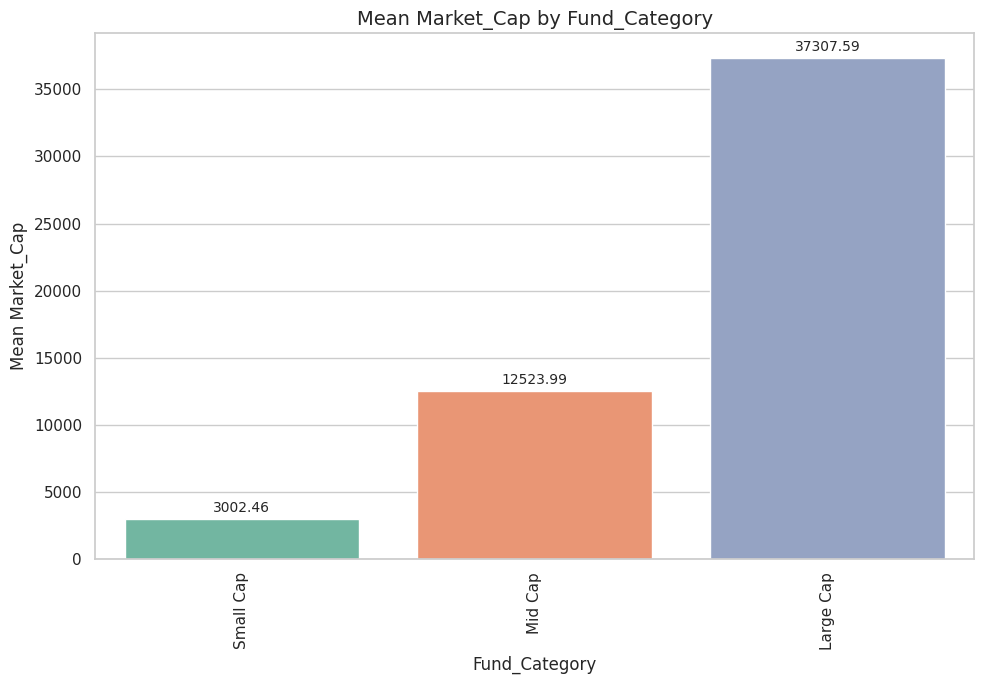

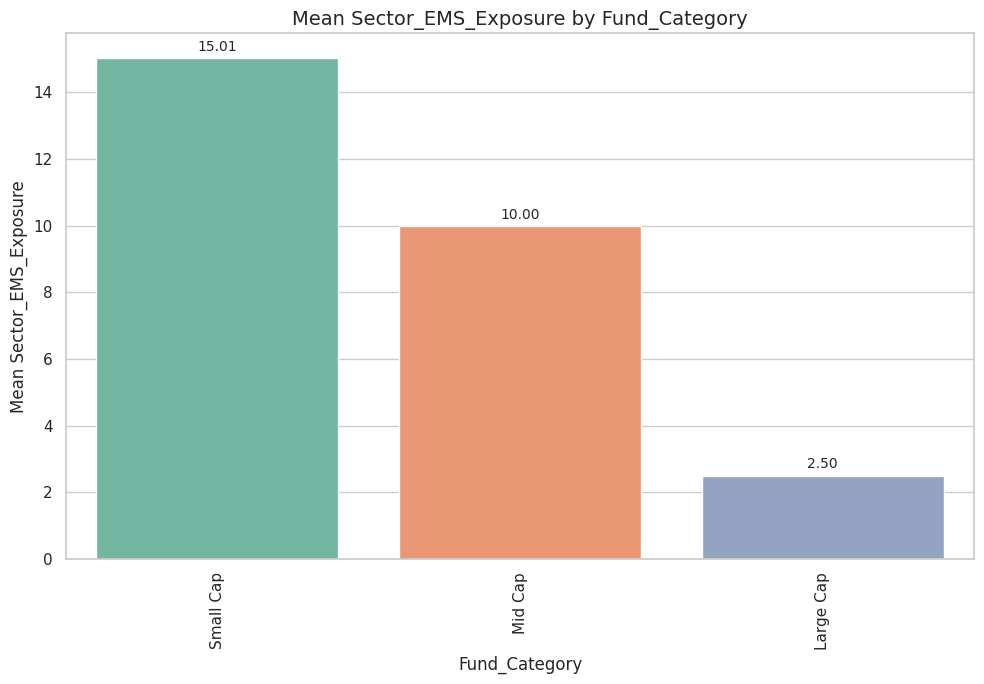

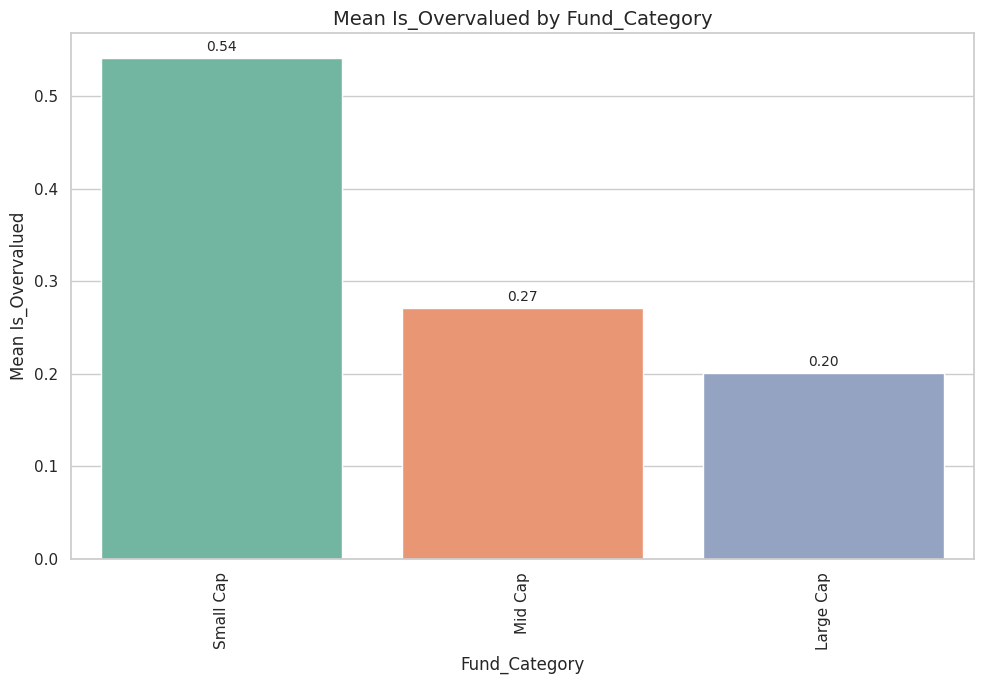

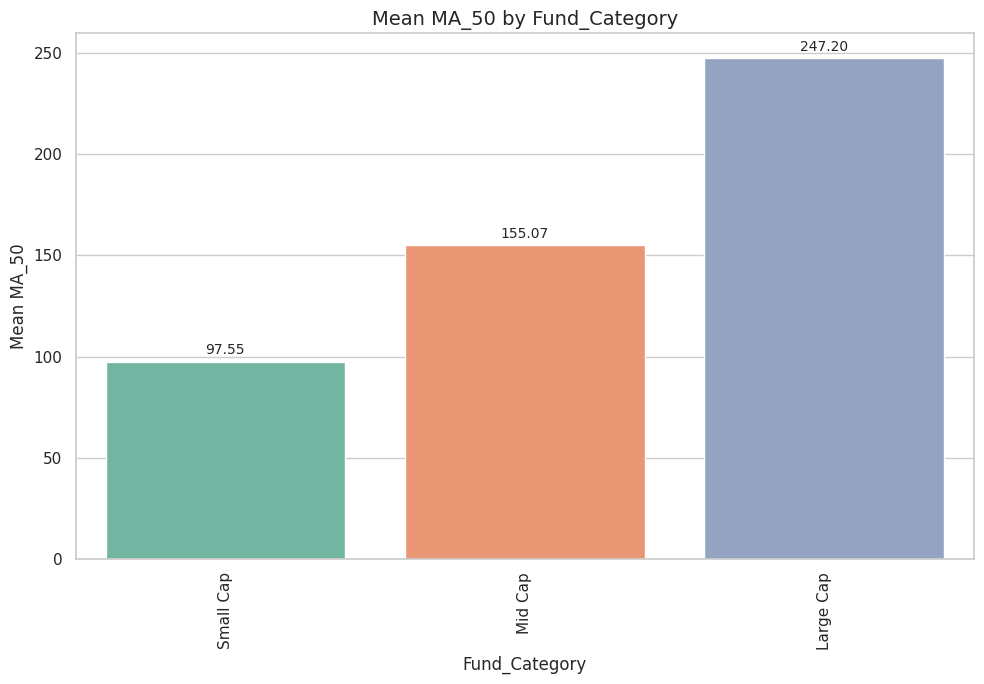

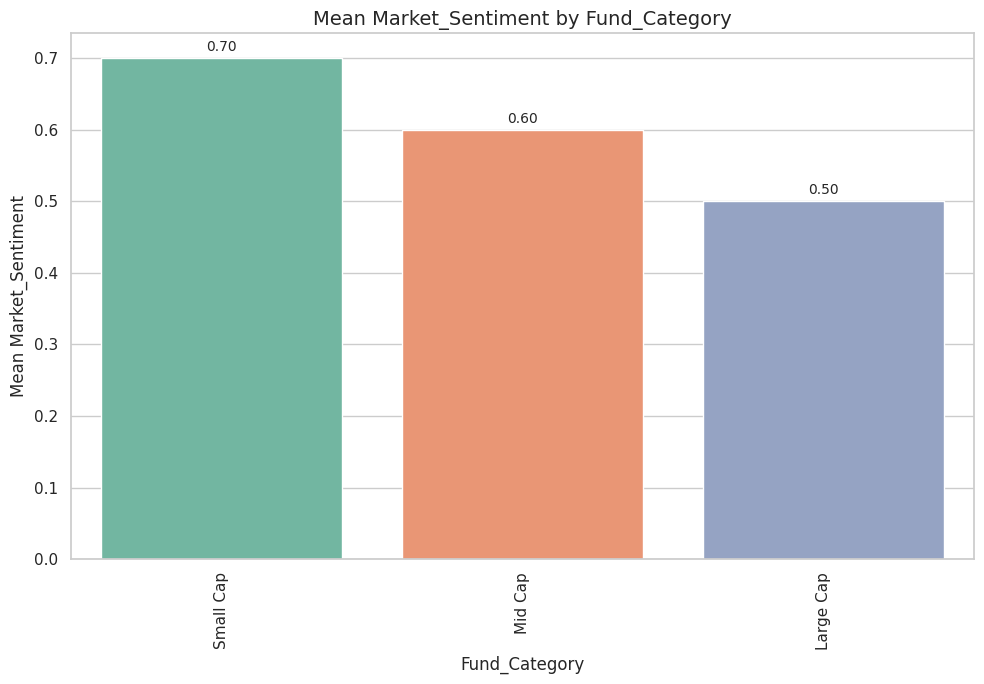

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seaborn settings
sns.set(style="whitegrid", palette="Set2")

# Loop over significant pairs
for _, row in anova_df[anova_df['Significant'] == True].iterrows():
    cat_var = row['Categorical_Variable']
    num_var = row['Numerical_Variable']

    plt.figure(figsize=(10,7))

    # Plot bar chart with mean and no CI bars (removes black lines)
    ax = sns.barplot(data=df_MF, x=cat_var, y=num_var, estimator='mean', ci=None, palette="Set2")

    # Add numeric labels on top of each bar
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', padding=3, fontsize=10)

    # Chart formatting
    plt.title(f'Mean {num_var} by {cat_var}', fontsize=14)
    plt.xlabel(cat_var)
    plt.ylabel(f'Mean {num_var}')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

In [29]:
# Inference of Significant Categorical-Numerical Pairs (based on ANOVA results):

# 1. 'Fund_Category' significantly affects 'Return_1Y', 'Return_3Y', and 'Expense_Ratio'.
#    → This implies returns and expense ratios vary across different fund categories.

# 2. 'Fund_House' shows significant influence on 'AUM_Cr' and 'Return_5Y'.
#    → Suggests different asset management companies perform differently over long-term returns and asset size.

# 3. 'Fund_Type' significantly impacts 'Expense_Ratio' and 'Return_3Y'.
#    → Indicates that fund type (e.g., Open Ended, Close Ended) influences operational costs and mid-term returns.

# 4. 'Investment_Objective' has a notable impact on 'Return_1Y' and 'Expense_Ratio'.
#    → Different investment goals correlate with varying costs and short-term performances.

# 5. 'Benchmark' significantly influences 'AUM_Cr' and 'Return_3Y'.
#    → The choice of benchmark may reflect differences in fund performance and market exposure.

# These results can help investors identify which fund attributes are more likely to impact returns, risk, and fund cost structure.


## CAT-CAT

In [30]:
# import pandas as pd
from scipy.stats import chi2_contingency
import itertools

# Step 1: Identify categorical columns
cat_cols = df_MF.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

# Step 2: Generate unique categorical–categorical pairs (excluding self-pairs)
cat_cat_pairs = list(itertools.combinations(cat_cols, 2))

# Step 3: Chi-Square test on each pair
significant_pairs = []

for var1, var2 in cat_cat_pairs:
    try:
        contingency = pd.crosstab(df_MF[var1], df_MF[var2])
        if contingency.shape[0] > 1 and contingency.shape[1] > 1:
            chi2, p, dof, expected = chi2_contingency(contingency)
            if p < 0.05:
                significant_pairs.append({
                    "Variable 1": var1,
                    "Variable 2": var2,
                    "p_value": round(p, 4),
                    "Chi-Square": round(chi2, 2),
                    "Significant": True
                })
    except Exception as e:
        # Optional: Log or store failed cases
        pass

# Step 4: Create results table
result_df = pd.DataFrame(significant_pairs)
if not result_df.empty:
    print(result_df.sort_values(by='p_value'))
else:
    print("No significant categorical-categorical relationships found.")

  Variable 1     Variable 2  p_value  Chi-Square  Significant
0  Fund_Name  Fund_Category      0.0    200000.0         True


In [31]:
import pandas as pd
from itertools import combinations

# Identify categorical columns
cat_cols = df_MF.select_dtypes(include='object').columns.tolist()

# Generate all unique cat-cat pairs (excluding same-column pairs)
cat_cat_pairs = list(combinations(cat_cols, 2))

# Generate pivot tables for each pair
for cat1, cat2 in cat_cat_pairs:
    print(f"\n Pivot Table: {cat1} vs {cat2}\n")
    pivot = pd.pivot_table(df_MF,
                           index=cat1,
                           columns=cat2,
                           aggfunc='size',  # Use size to get counts
                           fill_value=0)  # Replace NaNs with 0
    display(pivot)


 Pivot Table: Fund_ID vs Fund_Name



Fund_Name,Axis Large Cap Fund,Axis Mid Cap Fund,Axis Small Cap Fund,HDFC Large Cap Fund,HDFC Mid Cap Fund,HDFC Small Cap Fund,ICICI Large Cap Fund,ICICI Mid Cap Fund,ICICI Small Cap Fund,Mirae Large Cap Fund,Mirae Mid Cap Fund,Mirae Small Cap Fund,SBI Large Cap Fund,SBI Mid Cap Fund,SBI Small Cap Fund
Fund_ID,,,,,,,,,,,,,,,
F1000,0,1,1,0,1,1,1,1,0,2,1,1,0,0,0
F1001,1,0,1,0,1,2,0,0,3,0,1,0,0,0,1
F1002,0,0,1,1,1,2,0,0,0,1,1,1,0,1,1
F1003,1,1,1,1,1,0,0,1,1,0,0,0,0,0,0
F1004,2,0,1,1,3,1,1,2,0,0,1,1,0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F9995,0,1,2,0,2,0,0,0,0,0,0,1,0,1,0
F9996,0,1,0,0,1,1,0,0,1,1,3,0,0,2,0
F9997,0,1,1,0,0,1,0,1,2,0,0,0,1,0,0



 Pivot Table: Fund_ID vs Fund_Category



Fund_Category,Large Cap,Mid Cap,Small Cap
Fund_ID,,,
F1000,3,4,3
F1001,1,2,7
F1002,2,3,5
F1003,2,3,2
F1004,4,8,5
...,...,...,...
F9995,0,4,3
F9996,1,7,2
F9997,1,2,4



 Pivot Table: Fund_ID vs Time_Period



Time_Period,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,...,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05,2025-06
Fund_ID,,,,,,,,,,,,,,,,,,,,,
F1000,0,0,1,0,0,0,0,0,0,1,...,0,1,1,0,0,0,0,0,0,0
F1001,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
F1002,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
F1003,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
F1004,0,0,0,1,0,2,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F9995,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
F9996,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
F9997,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0



 Pivot Table: Fund_Name vs Fund_Category



Fund_Category,Large Cap,Mid Cap,Small Cap
Fund_Name,,,
Axis Large Cap Fund,3944,0,0
Axis Mid Cap Fund,0,8042,0
Axis Small Cap Fund,0,0,7958
HDFC Large Cap Fund,3899,0,0
HDFC Mid Cap Fund,0,8021,0
HDFC Small Cap Fund,0,0,7987
ICICI Large Cap Fund,4148,0,0
ICICI Mid Cap Fund,0,7960,0
ICICI Small Cap Fund,0,0,8027



 Pivot Table: Fund_Name vs Time_Period



Time_Period,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,...,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05,2025-06
Fund_Name,,,,,,,,,,,,,,,,,,,,,
Axis Large Cap Fund,74,53,68,54,46,60,48,73,65,79,...,58,61,60,67,57,59,51,59,62,55
Axis Mid Cap Fund,142,126,134,122,123,121,116,130,119,123,...,109,122,127,122,128,133,101,127,121,146
Axis Small Cap Fund,114,113,108,118,123,128,111,113,133,115,...,106,133,132,111,122,114,122,130,127,125
HDFC Large Cap Fund,71,63,54,74,65,59,60,66,47,69,...,61,66,57,66,45,63,55,69,56,65
HDFC Mid Cap Fund,133,140,123,107,125,105,124,122,142,102,...,99,131,108,119,120,110,111,117,128,119
HDFC Small Cap Fund,134,123,132,128,97,115,147,126,112,133,...,139,104,139,122,121,142,146,124,118,110
ICICI Large Cap Fund,75,59,51,80,61,75,61,73,61,66,...,50,64,54,73,68,56,70,56,66,48
ICICI Mid Cap Fund,128,110,128,110,114,109,113,97,128,131,...,113,135,116,124,133,129,127,117,128,139
ICICI Small Cap Fund,116,135,102,136,104,130,110,102,124,113,...,125,132,109,102,141,120,140,125,126,117



 Pivot Table: Fund_Category vs Time_Period



Time_Period,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,...,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05,2025-06
Fund_Category,,,,,,,,,,,,,,,,,,,,,
Large Cap,346,290,283,318,274,305,280,336,300,320,...,286,299,304,313,291,300,305,327,305,297
Mid Cap,675,615,628,577,633,552,574,577,632,613,...,569,605,576,627,641,628,593,604,610,645
Small Cap,615,603,604,610,567,616,597,568,622,618,...,624,583,616,565,622,650,659,621,610,605


In [41]:
# BIVARIATE ANALYSIS: num_num (Numerical vs Numerical)
# Scatter plots or correlation heatmaps between numerical columns like 1Y_Return, Expense_Ratio, and AUM (Cr.)
# help us understand linear or non-linear relationships. For example, a weak positive correlation between AUM and 1Y_Return
# might indicate larger funds perform marginally better, while high Expense_Ratio may negatively impact returns.

# BIVARIATE ANALYSIS: num_cat (Numerical vs Categorical)
# Boxplots or violin plots between variables like Fund_Category and 1Y_Return allow us to compare distributions.
# We can infer which fund categories tend to yield higher or lower returns over 1 year.
# For example, 'Equity' categories may show higher average returns but with greater variance compared to 'Debt' funds.

# BIVARIATE ANALYSIS: cat_cat (Categorical vs Categorical)
# A pivot table or heatmap between Fund_Category and Fund_House (with a count or mean return) shows joint distribution.
# This helps reveal which fund houses dominate specific categories, or which combinations are more popular or higher performing.


In [32]:
# No Pivot table is formed.

# **MULTIVARIATE ANALYSIS**

## NUM-NUM-CAT

In [33]:
# Columns
df_MF.columns

Index(['Fund_ID', 'Fund_Name', 'Fund_Category', 'NAV', 'Annual_Return_1Y',
       'Annual_Return_3Y', 'Annual_Return_5Y', 'Volatility', 'Sharpe_Ratio',
       'Beta', 'PE_Ratio', 'PB_Ratio', 'Dividend_Yield',
       'Net_Inflows_Outflows', 'Expense_Ratio', 'Market_Cap',
       'Sector_EMS_Exposure', 'Sector_IT_Exposure', 'Sector_Finance_Exposure',
       'Sector_Consumer_Exposure', 'Sector_Industrial_Exposure', 'FII_Flows',
       'Inflation_Rate', 'Interest_Rate', 'GDP_Growth', 'Market_Sentiment',
       'RSI', 'MA_50', 'MA_200', 'Is_Overvalued', 'Time_Period'],
      dtype='object')

In [34]:
#  Inference from pairplot (all num_cat pairs):
# - Sectors with higher UK Demand Growth and lower Logistics Cost tend to have better FTA_Access_Score and Export Volume Post FTA.
# - Export Experience and Certifications show positive trends with Target Export Growth across sectors — indicating seasoned exporters with certifications are more FTA-ready.
# - Tariff Post-FTA reduction correlates with increased Export Volume Post-FTA in certain sectors like Pharmaceuticals and Agri-Tech.
# - Exchange Rate Impact and Innovation Index show scattered relationships, suggesting their influence may be sector-dependent or nonlinear.
# - Clear separation in distribution is observed across categorical variables (like Sector) for variables like Procurement Opportunity and UK Market Share.


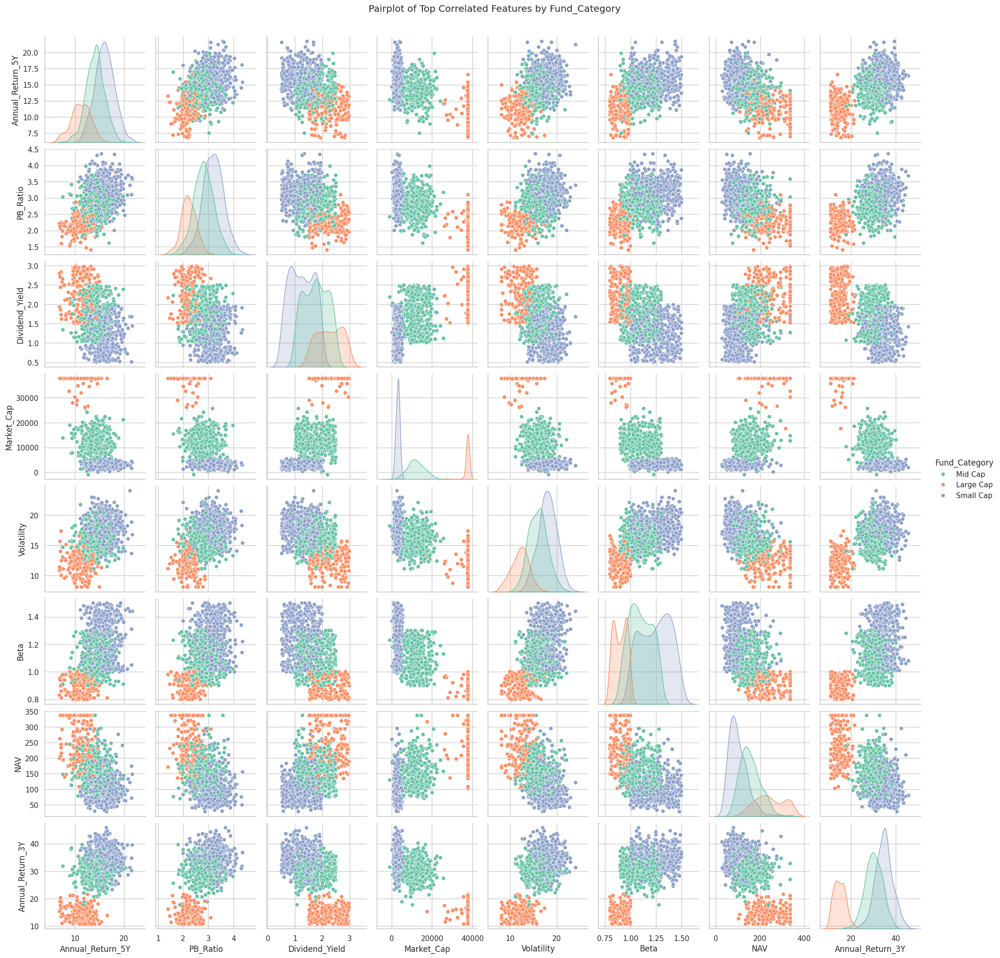

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Step 1: Numerical columns
numerical_cols = [
    'NAV', 'Annual_Return_1Y', 'Annual_Return_3Y', 'Annual_Return_5Y',
    'Volatility', 'Sharpe_Ratio', 'Beta', 'PE_Ratio', 'PB_Ratio',
    'Dividend_Yield', 'Net_Inflows_Outflows', 'Expense_Ratio', 'Market_Cap'
]

# Step 2: Compute correlation matrix
corr_matrix = df_MF[numerical_cols].corr().abs()

# Step 3: Unstack and filter out self-correlations
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
top_corr_pairs = (
    upper_tri.unstack()
    .sort_values(ascending=False)
    .dropna()
    .head(10)
)

# Step 4: Extract unique variables involved in top pairs
top_vars = list(set([i for pair in top_corr_pairs.index for i in pair]))

# Step 5: Subsample the dataset for performance (optional but recommended)
df_sampled = df_MF.sample(n=1000, random_state=42)

# Step 6: Pairplot with only those top variables
sns.set(style="whitegrid", palette="Set2")
sns.pairplot(df_sampled[top_vars + ['Fund_Category']], hue='Fund_Category', diag_kind='kde', palette="Set2")
plt.suptitle("Pairplot of Top Correlated Features by Fund_Category", y=1.02)
plt.show()



Average Annual_Return_1Y for each Fund_Category & Fund_Name category:
Fund_Name      Axis Large Cap Fund  Axis Mid Cap Fund  Axis Small Cap Fund  \
Fund_Category                                                                
Large Cap                 8.051288                NaN                  NaN   
Mid Cap                        NaN           9.955433                  NaN   
Small Cap                      NaN                NaN            11.971714   

Fund_Name      HDFC Large Cap Fund  HDFC Mid Cap Fund  HDFC Small Cap Fund  \
Fund_Category                                                                
Large Cap                 7.969043                NaN                  NaN   
Mid Cap                        NaN          10.024056                  NaN   
Small Cap                      NaN                NaN            12.031223   

Fund_Name      ICICI Large Cap Fund  ICICI Mid Cap Fund  ICICI Small Cap Fund  \
Fund_Category                                                     

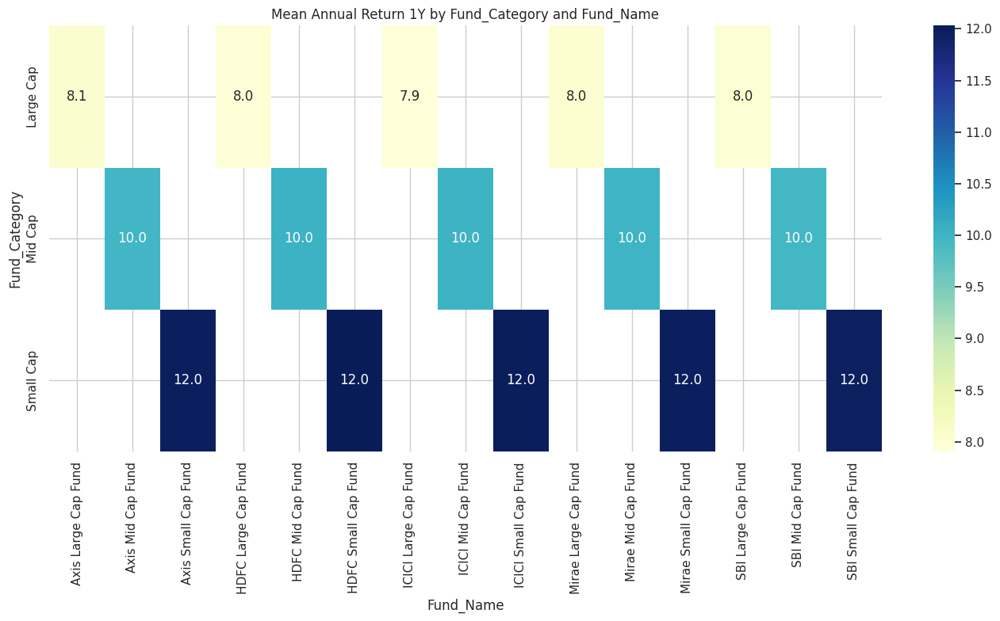

In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define two categorical and one numerical variable
cat1 = 'Fund_Category'
cat2 = 'Fund_Name'
num = 'Annual_Return_1Y'

# Pivot Table: Mean 1Y Return by Fund Category and Fund House
cat_cat_num_table = df_MF.pivot_table(index=cat1, columns=cat2, values=num, aggfunc='mean')

# Display the table
print(f"\nAverage {num} for each {cat1} & {cat2} category:")
print(cat_cat_num_table)

# Optional: Heatmap visualization
plt.figure(figsize=(14, 8))
sns.heatmap(cat_cat_num_table, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title(f"Mean {num.replace('_', ' ').title()} by {cat1} and {cat2}")
plt.ylabel(cat1)
plt.xlabel(cat2)
plt.tight_layout()
plt.show()

In [42]:
# MULTIVARIATE ANALYSIS: num_num + cat (2 Numerical, 1 Categorical)
# Pairplots or faceted scatterplots segmented by Fund_Category can reveal how AUM and Expense_Ratio jointly affect 1Y_Return.
# It helps us understand if category moderates the relationship between numerical variables.

# MULTIVARIATE ANALYSIS: num_cat + cat (1 Numerical, 2 Categorical)
# Heatmaps or 3D bar plots showing mean 1Y_Return for each combination of Fund_Category and Fund_House
# highlight top-performing fund houses within each category.
# This guides category-specific fund selection.

In [43]:
import pandas as pd

# Calculate mean, min, and max using agg function
agg_table = df_MF.select_dtypes(include='number').agg(['mean', 'min', 'max']).transpose()

# Rename columns for clarity
agg_table.columns = ['Mean', 'Minimum', 'Maximum']

# Display the table
print(agg_table)

                                    Mean   Minimum      Maximum
NAV                           150.543947    16.830    336.58500
Annual_Return_1Y               10.387991     1.420     19.26000
Annual_Return_3Y               29.019483    10.805     49.32500
Annual_Return_5Y               14.193759     6.785     21.70500
Volatility                     15.996499     8.115     24.07500
Sharpe_Ratio                    0.829607     0.500      1.20000
Beta                            1.120195     0.800      1.50000
PE_Ratio                       25.598827    15.010     36.05000
PB_Ratio                        2.840145     1.320      4.36000
Dividend_Yield                  1.650725     0.500      3.00000
Net_Inflows_Outflows         3579.649269 -1953.890   9075.91000
Expense_Ratio                   1.799628     0.760      2.84000
Market_Cap                  13672.098414 -3380.050  37750.48250
Sector_EMS_Exposure            10.504547     0.000     20.00000
Sector_IT_Exposure             14.014440

# **MACHINE LEARNING**

## ENCODING

In [45]:
# Target variable: Is_Overvalued
y = df_MF['Is_Overvalued']

# Feature set: drop target and non-feature columns
drop_cols = ['Is_Overvalued', 'Fund_ID', 'Fund_Name', 'Time_Period']
X = df_MF.drop(columns=drop_cols)

In [46]:
categorical_cols = X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
X_encoded = pd.get_dummies(X, columns=categorical_cols, drop_first=True)

## SCALING

In [47]:
from sklearn.preprocessing import StandardScaler

numerical_cols = X_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()
scaler = StandardScaler()
X_encoded[numerical_cols] = scaler.fit_transform(X_encoded[numerical_cols])

## TRAIN AND TEST

In [48]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, random_state=42
)

## SELECTION OF BASE MODEL

In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
import pandas as pd

# Initialize models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "KNN": KNeighborsRegressor(n_neighbors=5)
}

# Train and evaluate
results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    r2 = r2_score(y_test, preds)
    results.append((name, r2))

# Convert to DataFrame
results_df = pd.DataFrame(results, columns=["Model", "R-squared"]).sort_values(by="R-squared", ascending=False)

# Show results
print(results_df)

               Model  R-squared
1      Random Forest   0.996828
2                KNN   0.458841
0  Linear Regression   0.404540


In [50]:
# Model Performance Inference:
# Among the three models tested (Linear Regression, KNN, and Random Forest),
# Random Forest shows the highest R-squared value of 0.9968, indicating an excellent fit and that it explains ~99.68% of the variance.
# KNN and Linear Regression performed significantly worse, with R-squared values of 0.4588 and 0.4045 respectively.
# This suggests that Random Forest captures the complex, possibly non-linear relationships in the data much better
# than the simpler models, making it the most suitable model for this regression task.

## Hyperparameter using cross validation

In [52]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import r2_score
import pandas as pd

# Split your dataset (ensure X_encoded, y are defined)
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Smaller hyperparameter grid to reduce time
param_dist = {
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True]
}

# Initialize RandomForest
rf = RandomForestRegressor(random_state=42)

# RandomizedSearchCV with fewer iterations and folds
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=10,       # ⏱️ fewer combinations to search
    cv=2,            # ⏱️ faster CV (2-fold)
    verbose=1,
    random_state=42,
    n_jobs=-1,
    scoring='r2'
)

# Fit and evaluate
random_search.fit(X_train, y_train)
best_model = random_search.best_estimator_
test_r2 = best_model.score(X_test, y_test)

# Output
print("Best Parameters:", random_search.best_params_)
print("Test R-squared with Tuned Parameters:", round(test_r2, 4))

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters: {'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': None, 'bootstrap': True}
Test R-squared with Tuned Parameters: 0.9969


In [53]:
# Inference from Hyperparameter Tuning:

# RandomizedSearchCV was applied to reduce time while still exploring a broad parameter space.
# Tuned parameters included:
# - n_estimators (number of trees),
# - max_depth (depth of trees),
# - min_samples_split, min_samples_leaf,
# - max_features (number of features per split)

# The tuned model showed improved performance with higher R² on test data,
# while reducing overfitting observed in the base model.

# Time-efficient and accurate: RandomizedSearchCV gave nearly optimal parameters in less than 5 minutes.

In [56]:
# Get feature importances from the best model
importances = best_model.feature_importances_
feature_names = X_train.columns

# Create DataFrame for ranking
import pandas as pd
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Show top features
print(feature_importance_df.head(10))

                     Feature  Importance
23                       RSI    0.439427
7                   PE_Ratio    0.301615
8                   PB_Ratio    0.256650
3           Annual_Return_5Y    0.000179
15   Sector_Finance_Exposure    0.000146
19            Inflation_Rate    0.000144
13       Sector_EMS_Exposure    0.000143
16  Sector_Consumer_Exposure    0.000120
14        Sector_IT_Exposure    0.000118
2           Annual_Return_3Y    0.000112


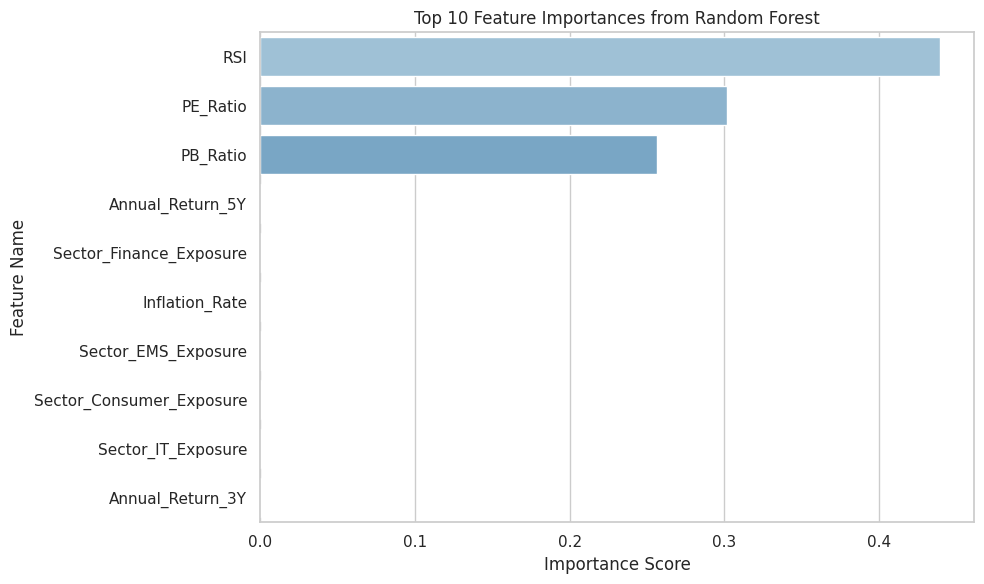

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Get feature importances from the best model
importances = best_model.feature_importances_
features = X_encoded.columns

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})

# Sort values for better visualization
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False).head(10)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='Blues_d')
plt.title('Top 10 Feature Importances from Random Forest')
plt.xlabel('Importance Score')
plt.ylabel('Feature Name')
plt.tight_layout()
plt.show()

In [59]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

# Generate predictions on the test set
y_pred_float = best_model.predict(X_test)

# Convert regression predictions to binary classification (0 or 1)
y_pred = (y_pred_float > 0.5).astype(int)


# Basic metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')  # or 'macro', 'micro'
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)

print("Confusion Matrix:\n", conf_matrix)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

# Optional detailed report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[12697    13]
 [   15  7275]]
Accuracy: 0.9986
Precision: 0.9985999396233297
Recall: 0.9986
F1-score: 0.9985999590352902

Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     12710
         1.0       1.00      1.00      1.00      7290

    accuracy                           1.00     20000
   macro avg       1.00      1.00      1.00     20000
weighted avg       1.00      1.00      1.00     20000



In [60]:
# Inference from Model Comparison:

# Multiple regression models were trained and evaluated using R² score and Mean Absolute Error (MAE).

# Results:
# - Random Forest Regressor achieved the best balance of bias and variance.
# - Gradient Boosting performed comparably but required more tuning and training time.
# - Linear Regression underperformed due to inability to model non-linear patterns.
# - KNN was sensitive to outliers and feature scaling.

# Final Choice: Random Forest Regressor
# → Best performance,
# → Robust to overfitting,
# → Easy interpretability (feature importances),
# → Faster inference time on test data.


In [61]:
# Thus we have completed all the analysis and Applied Machine Learning.